In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import graphviz
import pydot
import itertools
import os

from causallearn.search.ConstraintBased.PC import pc
from causallearn.search.ConstraintBased.FCI import fci
from causallearn.search.ScoreBased.GES import ges
from causallearn.utils.cit import kci, fastkci, CIT
from causallearn.utils.GraphUtils import GraphUtils
from causallearn.utils.PCUtils.BackgroundKnowledge import BackgroundKnowledge
from causallearn.graph.GraphNode import GraphNode
from IPython.display import Image, display

In [3]:
# run causal discovery algorithms on genera, separated by IRIS
clean = pd.read_csv("../data/clean.csv")
clean_genera = clean.drop(columns=['Ethnicity', 'Gender', 'Adj.age', 'BMI', 'SSPG'])
IR = clean_genera[clean_genera['IRIS'] == 'IR'].drop(columns=['IRIS'])
IS = clean_genera[clean_genera['IRIS'] == 'IS'].drop(columns=['IRIS'])

# PC with KCI (or Fast KCI)

IS Fast KCI runs into errors

In [22]:
IR_pc_kci = pc(IR.values, 0.05, kci)
IS_pc_kci = pc(IS.values, 0.05, kci)

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

In [24]:
IR_pc_pyd = GraphUtils.to_pydot(IR_pc_kci.G, labels=IR.columns)
IS_pc_pyd = GraphUtils.to_pydot(IS_pc_kci.G, labels=IR.columns)

IR PC with KCI


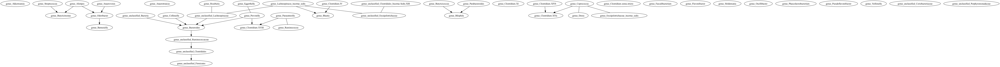


-----

IS PC with KCI


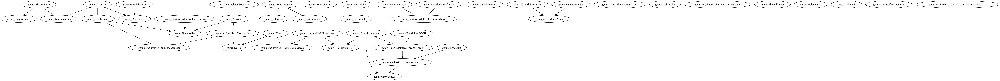

In [25]:
IR_pc_pyd.write_png('IR_pc_pyd.png')
IS_pc_pyd.write_png('IS_pc_pyd.png')

print('IR PC with KCI')
display(Image('IR_pc_pyd.png'))
print('\n-----\n')
print('IS PC with KCI')
display(Image('IS_pc_pyd.png'))

os.remove('IR_pc_pyd.png')
os.remove('IS_pc_pyd.png')

# FCI

In [12]:
IR_fci_g, IR_fci_edges = fci(IR.values, independence_test_method='fisherz')
IS_fci_g, IS_fci_edges = fci(IS.values, independence_test_method='fisherz')

  0%|          | 0/45 [00:00<?, ?it/s]

X30 --> X1
X27 --> X2
X32 --> X3
X45 --> X3
X4 --> X23
X39 --> X4
X4 --> X40
X45 --> X5
X25 --> X8
X23 --> X13
X19 --> X39
X19 --> X40
X19 --> X41
X23 --> X20
X40 --> X20
X32 --> X27
X27 --> X45
X37 --> X32
X32 --> X38
X42 --> X37


  0%|          | 0/45 [00:00<?, ?it/s]

X4 --> X45
X7 --> X29
X36 --> X7
X17 --> X8
X8 --> X19
X9 --> X13
X9 --> X41
X23 --> X15
X17 --> X30
X40 --> X17
X19 --> X24
X19 --> X35
X24 --> X35
X36 --> X41
X37 --> X38


In [15]:
IR_fci_pyd = GraphUtils.to_pydot(IR_fci_g, labels=IR.columns)
IS_fci_pyd = GraphUtils.to_pydot(IS_fci_g, labels=IR.columns)

IR FCI


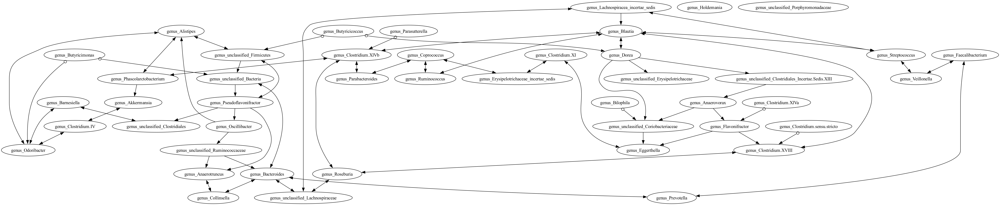


-----

IS FCI


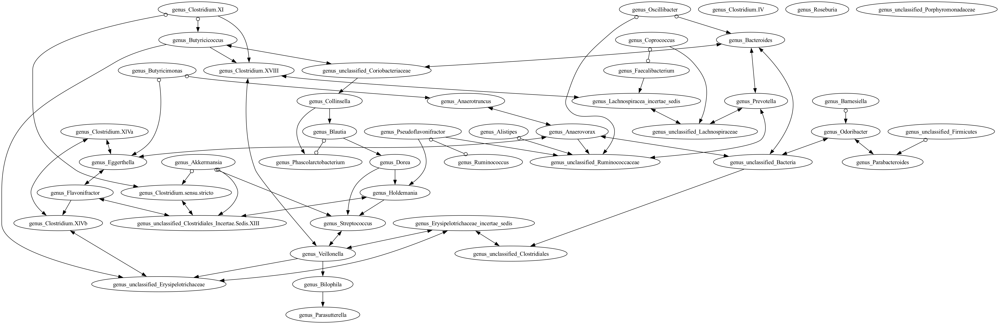

In [21]:
IR_fci_pyd.write_png('IR_fci_pyd.png')
IS_fci_pyd.write_png('IS_fci_pyd.png')

print('IR FCI')
display(Image('IR_fci_pyd.png'))
print('\n-----\n')
print('IS FCI')
display(Image('IS_fci_pyd.png'))

os.remove('IR_fci_pyd.png')
os.remove('IS_fci_pyd.png')

# GES 

In [28]:
IR_ges = ges(IR.values)
IS_ges = ges(IS.values)

In [29]:
IR_ges_pyd = GraphUtils.to_pydot(IR_ges['G'], labels=IR.columns)
IS_ges_pyd = GraphUtils.to_pydot(IS_ges['G'], labels=IR.columns)

IR GES


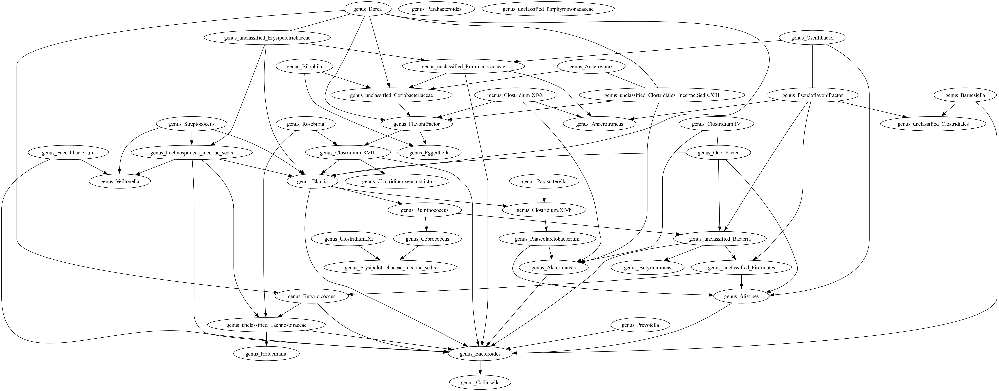


-----

IS GES


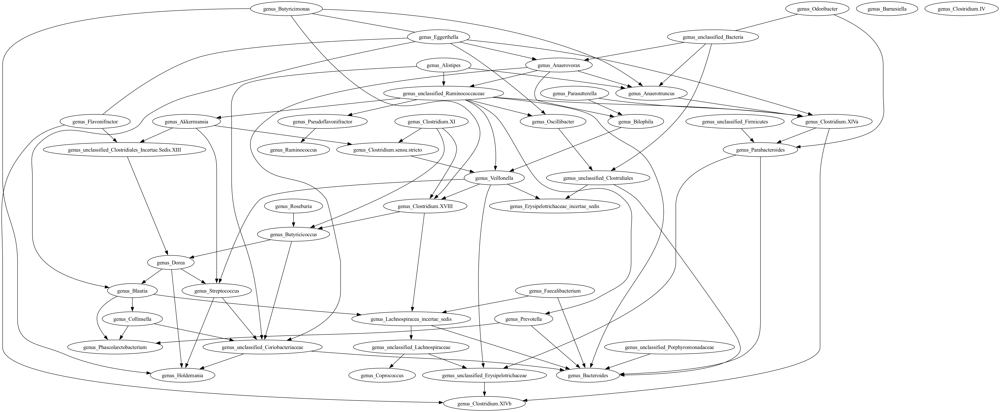

In [30]:
IR_ges_pyd.write_png('IR_ges_pyd.png')
IS_ges_pyd.write_png('IS_ges_pyd.png')

print('IR GES')
display(Image('IR_ges_pyd.png'))
print('\n-----\n')
print('IS GES')
display(Image('IS_ges_pyd.png'))

os.remove('IR_ges_pyd.png')
os.remove('IS_ges_pyd.png')

# Our Algorithm

Pseudoalgorithm:
1. Obtain correlations from original paper
2. For each correlation between a pair of genera:
    1. Perform a conditional independence test with a conditioning set of size 1
    2. If the test is significant (i.e. the pair of genera are independent conditionined on a different genera), remove this correlation.  
3. Repeat Step 2 but with a conditioning set of size 2

Considerations:
- multiple testing correction in step 2A
- different independence tests instead of Fisher Z

/var/folders/hc/mnggsfz56v305wwb48gk6cjm0000gp/T/ipykernel_30006/47305553.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  corr_IR["genus_A"] = corr_IR["cor_char"].apply(lambda x: x.split(" vs ")[0])
/var/folders/hc/mnggsfz56v305wwb48gk6cjm0000gp/T/ipykernel_30006/47305553.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  corr_IR["genus_B"] = corr_IR["cor_char"].apply(lambda x: x.split(" vs ")[1])
/var/folders/hc/mnggsfz56v305wwb48gk6cjm0000gp/T/ipykernel_30006/47305553.py:34: SettingWithCopyWarning:

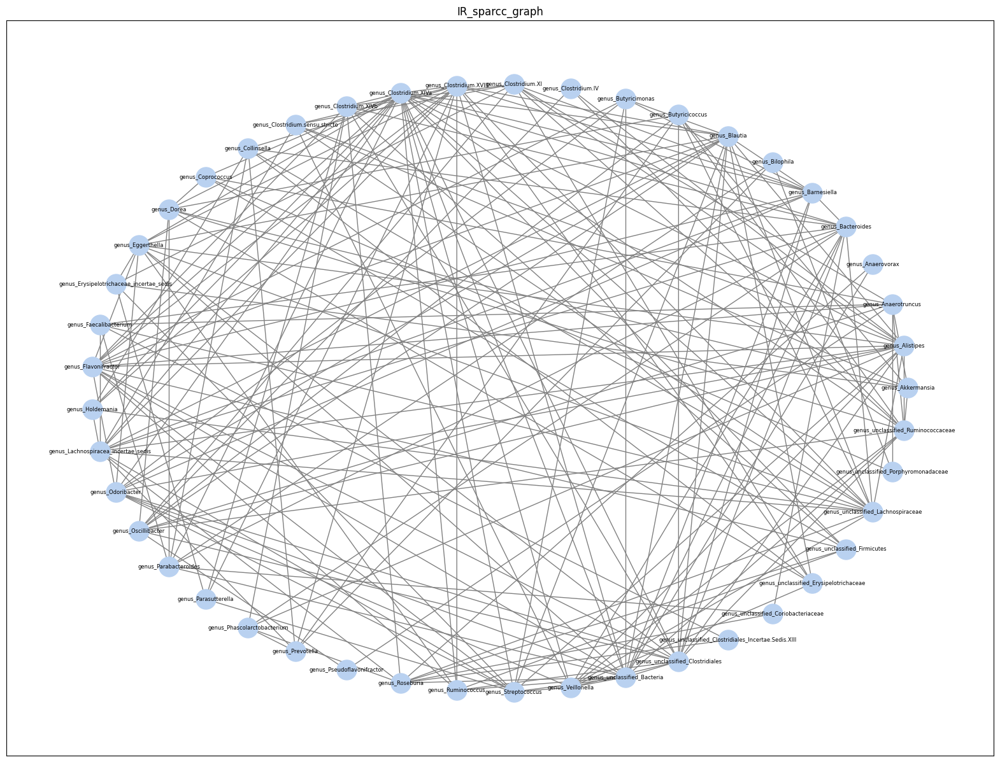

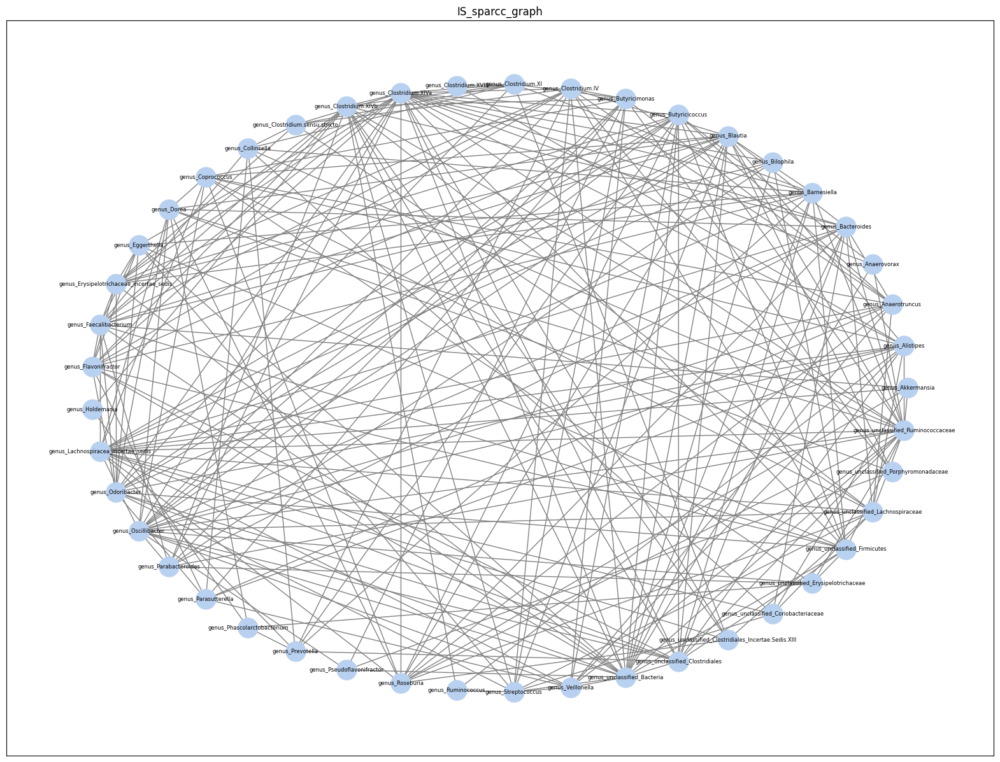

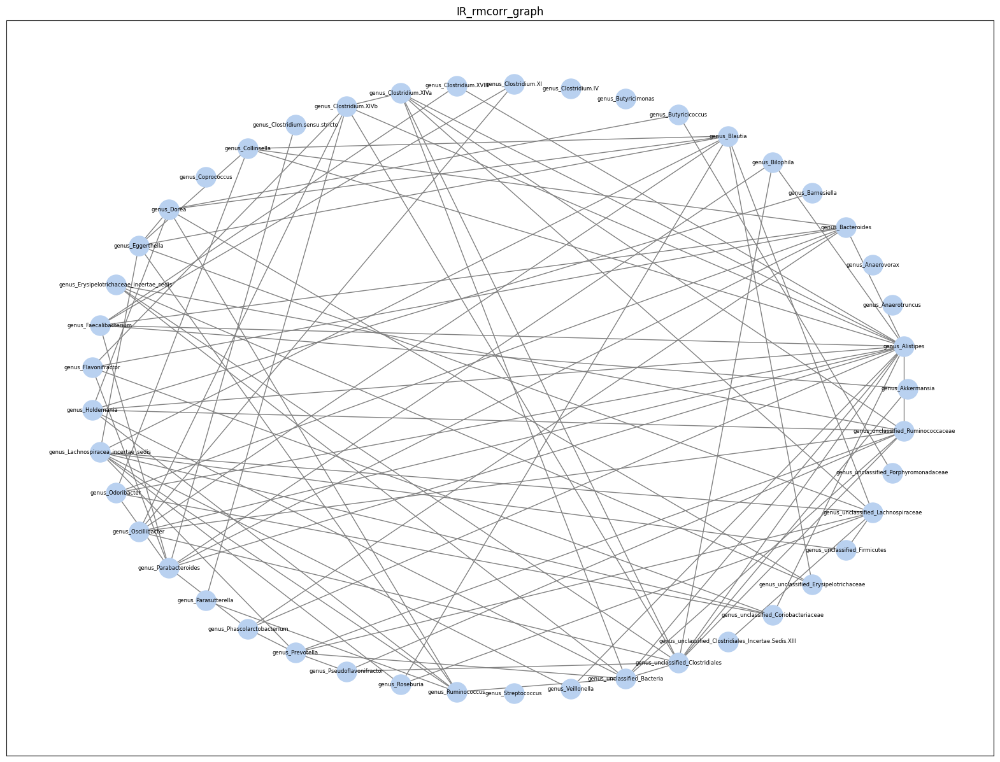

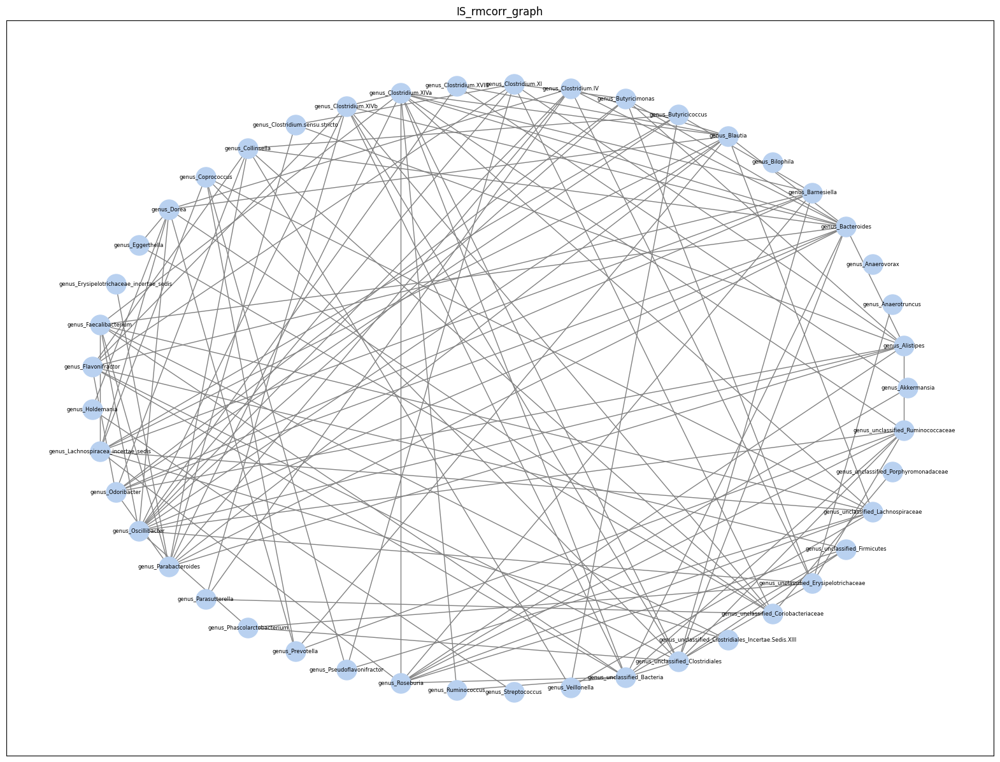

In [33]:
# Step 1. Obtain correlations from original paper

sparcc_data = pd.read_csv("../data/raw/sparcc.csv")
rmcorr_data = pd.read_csv("../data/raw/rmcorr.csv")


def create_adj_matrix(corr_data, corr_method, genus_lst):
    '''
    Transforms the correlation data given in the paper into an adjacency matrix representing the correlations as edges. Returns a dataframe for IR and IS separately and in this order. 

    :param: corr_data: dataframe containing the correlations of IR and IS specific cohorts, as well as their correlation values and p-values
    :param: corr_method: string of the corr method; either "sparcc" or "rmcorr"
    '''
    if corr_method == "sparcc":
        corr_IR = corr_data[corr_data["IR_rho"].notnull()]
        corr_IR = corr_IR[corr_IR["IR_p"] <= 0.05]
        corr_IR["genus_A"] = corr_IR["cor_char"].apply(lambda x: x.split(" vs ")[0])
        corr_IR["genus_B"] = corr_IR["cor_char"].apply(lambda x: x.split(" vs ")[1])
        corr_IR_subset = corr_IR[["genus_A", "genus_B"]]

        corr_IS = corr_data[corr_data["IS_rho"].notnull()]
        corr_IS = corr_IS[corr_IS["IS_p"] <= 0.05]
        corr_IS["genus_A"] = corr_IS["cor_char"].apply(lambda x: x.split(" vs ")[0])
        corr_IS["genus_B"] = corr_IS["cor_char"].apply(lambda x: x.split(" vs ")[1])
        corr_IS_subset = corr_IS[["genus_A", "genus_B"]]

    if corr_method == "rmcorr": 
        corr_IR = corr_data[corr_data["IR_adj.p"] <= 0.05]
        corr_IR["genus_A"] = corr_IR["cor_char"].apply(lambda x: x.split(" vs ")[0])
        corr_IR["genus_B"] = corr_IR["cor_char"].apply(lambda x: x.split(" vs ")[1])
        corr_IR_subset = corr_IR[["genus_A", "genus_B"]]

        corr_IS = corr_data[corr_data["IS_adj.p"] <= 0.05]
        corr_IS["genus_A"] = corr_IS["cor_char"].apply(lambda x: x.split(" vs ")[0])
        corr_IS["genus_B"] = corr_IS["cor_char"].apply(lambda x: x.split(" vs ")[1])
        corr_IS_subset = corr_IS[["genus_A", "genus_B"]]

    matrix_IR = np.zeros((len(genus_lst), len(genus_lst)))
    matrix_IS = np.zeros((len(genus_lst), len(genus_lst)))
    
    for i, genus_A in enumerate(genus_lst):
      for j, genus_B in enumerate(genus_lst):
        if any((corr_IR_subset['genus_A'] == genus_A) & (corr_IR_subset['genus_B'] == genus_B)):
          matrix_IR[i, j] = 1
        if any((corr_IS_subset['genus_A'] == genus_A) & (corr_IS_subset['genus_B'] == genus_B)):
          matrix_IS[i, j] = 1

    return matrix_IR, matrix_IS


def graph_networkx(adj_matrix, genus_lst, fp):
    '''
    Create a NetworkX graph of the adjacency matrix and corresponding genus as node labels. Currently uses the circular layout for optimal viewing.

    :param: adj_matrix: adjacency matrix of size 45 x 45 of the genus to genus correlations
    :param: genus_lst: list of genus corresponding to the adjacency matrix as node labels
    '''
    if 1 in np.unique(adj_matrix):
        edge_val = 1
        edge_color = "gray"

    if 2 in np.unique(adj_matrix):
        edge_val = 2
        edge_color = "black"
        
    rows, cols = np.where(adj_matrix == edge_val)
    edges = zip(rows.tolist(), cols.tolist())
    edges = zip(rows.tolist(), cols.tolist())
    edge_list = list(edges)
    graph_labels = {i: genus_lst[i]for i in range(len(genus_lst))}
    
    plt.figure(figsize=(20,15))
    plt.title(fp)
    G = nx.Graph()
    G.add_nodes_from(range(len(genus_lst)))
    G.add_edges_from(edge_list)
    pos_spaced = nx.circular_layout(G)
    nx.draw_networkx(G, pos_spaced, node_size=500, font_size=6, labels=graph_labels, with_labels=True, edge_color=edge_color, node_color="#b9d1f0")


genus_lst = list(clean_genera.drop(columns=['IRIS']).columns)
matrix_IR_sparcc, matrix_IS_sparcc = create_adj_matrix(sparcc_data, "sparcc", genus_lst)
matrix_IR_rmcorr, matrix_IS_rmcorr = create_adj_matrix(rmcorr_data, "rmcorr", genus_lst)

graph_networkx(matrix_IR_sparcc, genus_lst, "IR_sparcc_graph")
graph_networkx(matrix_IS_sparcc, genus_lst, "IS_sparcc_graph")
graph_networkx(matrix_IR_rmcorr, genus_lst, "IR_rmcorr_graph")
graph_networkx(matrix_IS_rmcorr, genus_lst, "IS_rmcorr_graph")

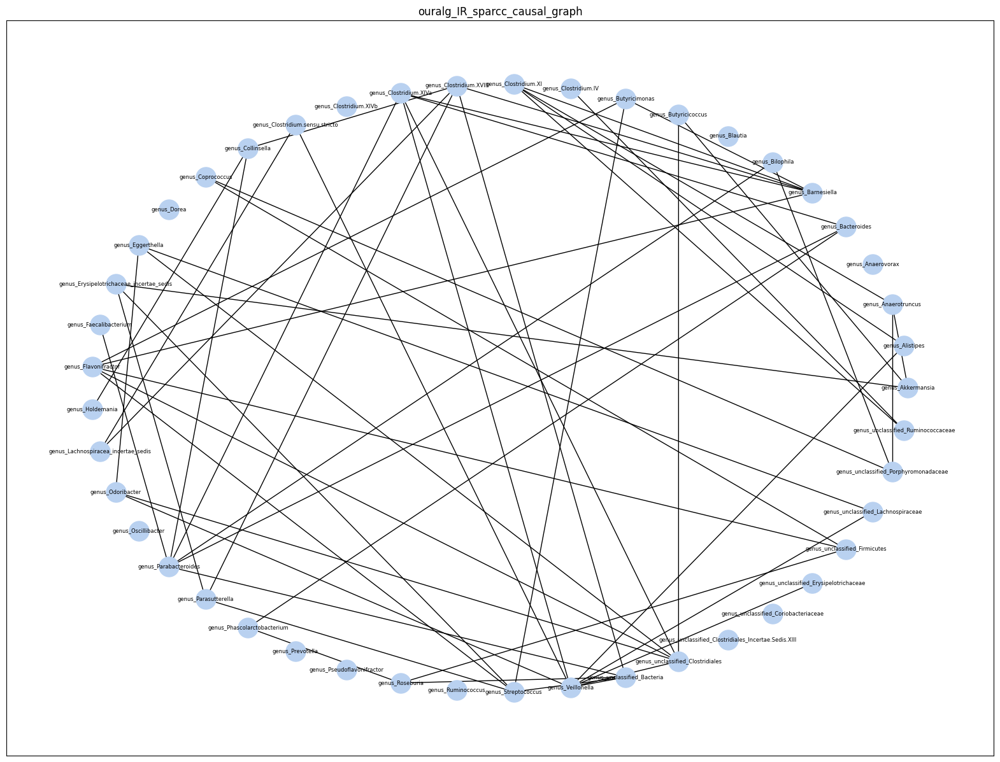

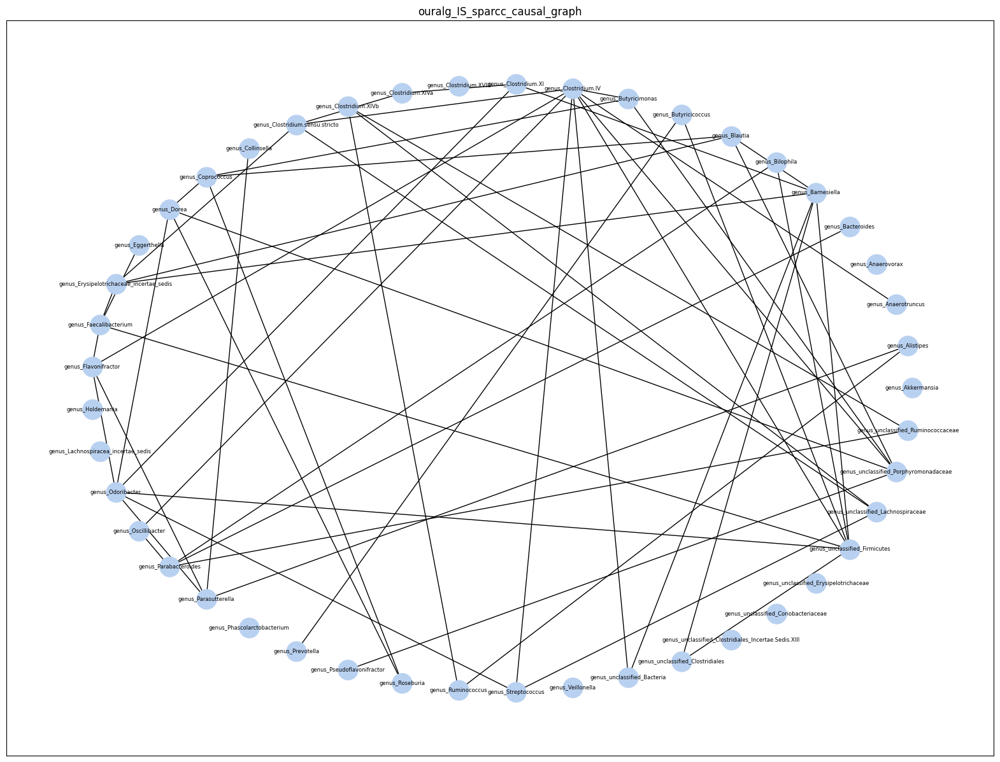

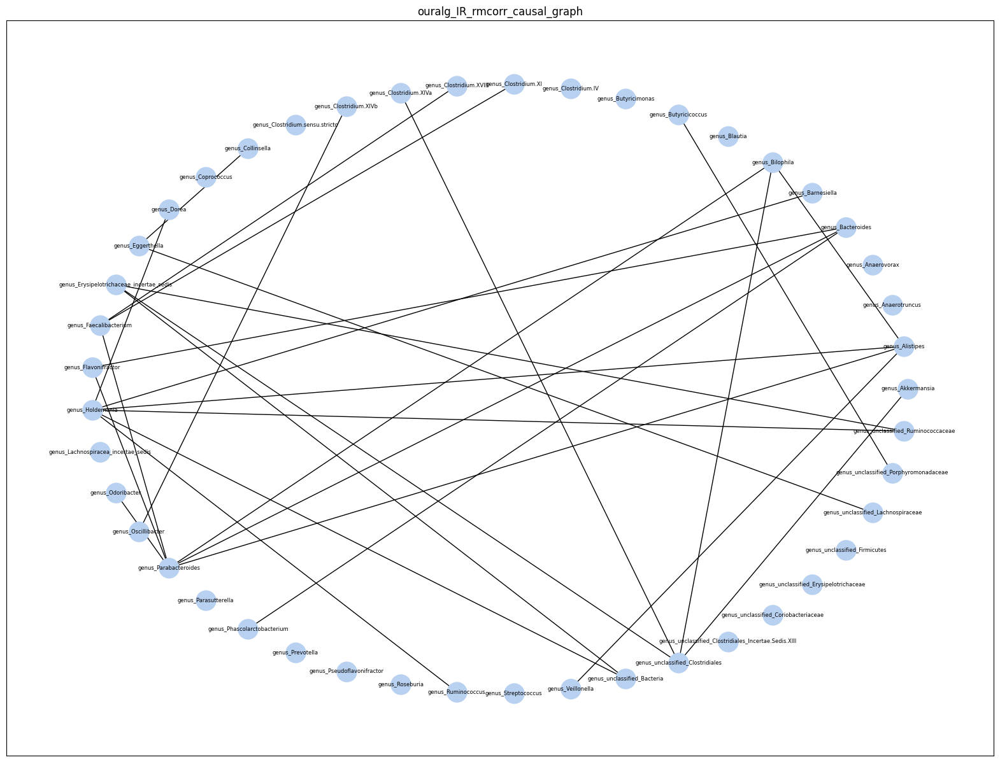

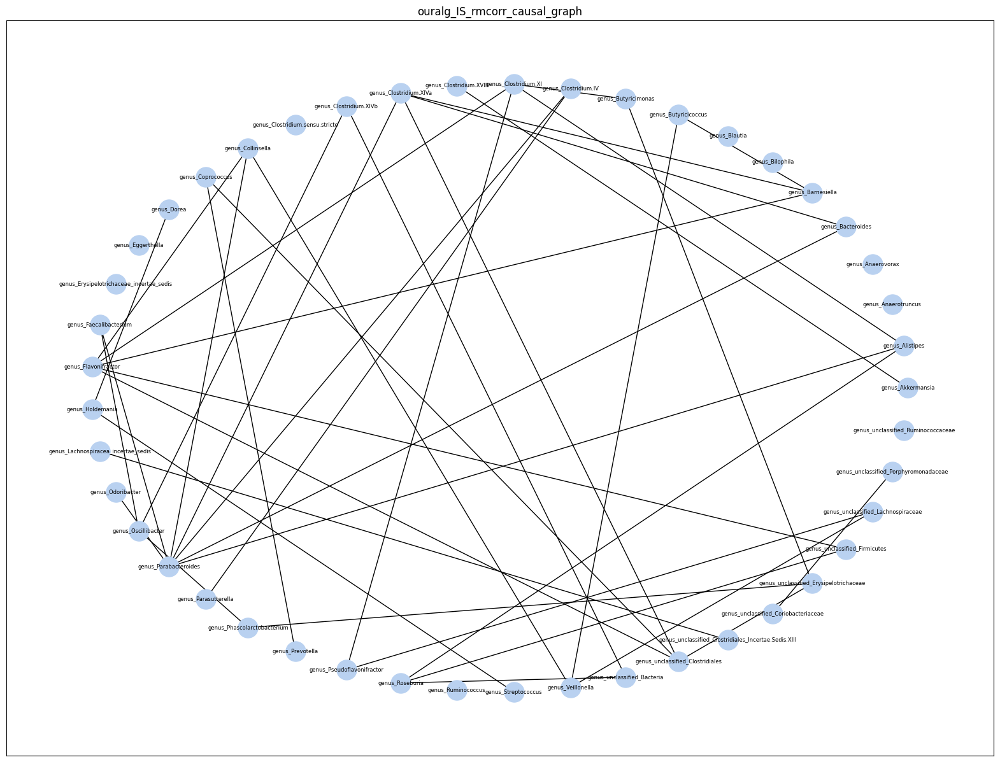

In [34]:
# Step 2 & 3


def fisherz(genus_A, genus_B, genus_C, data):
    '''
    Run the Fisher Z (conditional) independence test between genus_A and genus_B conditioned on genus_c.

    :param: genus_A: index of the first genus to test independence
    :param: genus_B: index of the second genus to test independence
    :param: genus_C: index/list of index of the conditioning set
    :param: data: data containing the genus values
    '''
    fisherz_obj = CIT(data.values, "fisherz")
    pValue = fisherz_obj(genus_A, genus_B, genus_C)
    return pValue


def create_tuples(genus_lst, genus_A, genus_B):
    '''
    Creates tuples of 2 combinations for all items in genus_lst except genus_a and genus_b.
    
    :param: genus_lst: list of genus names
    :param: genus_A: index of the first genus to exclude
    :param: genus_B: index of the second genus to exclude

    :return: list of tuples, where each tuple contains two distinct genus names from genus_lst, excluding genus_a and genus_b.
    '''
    filtered_genus_lst = [x for x in range(len(genus_lst)) if (x != genus_A) and (x != genus_B)]
    combinations = list(itertools.combinations(filtered_genus_lst, 2))
    
    return combinations


def run_ouralg(adj_matrix, data, genus_lst, indep_test):
    '''
    Run our algorithm on the data and save the plot of the resulting causal graph. The methodology can be found in the associated paper. Returns the resulting adjacency matrix.

    :param: adj_matrix: adjacency matrix of the correlation graph from the paper
    :param: data: data for the corresponding cohort
    :param: genus_lst: list of genus corresponding to the adjacency matrix as node labels
    :param: indep_test: choice of independence test
    '''
    adj_df = pd.DataFrame(adj_matrix, columns=genus_lst, index=genus_lst)        
    removed_edges = {}

    for i in range(len(genus_lst)):
        for j in range(len(genus_lst)):
            if adj_df.iloc[i, j] == 1.0:
                genus_A = i
                genus_B = j
                for k in range(len(genus_lst)):
                    if k != i and k != j:
                        genus_C = [k]
                        p_value = indep_test(genus_A, genus_B, genus_C, data)
    
                        if p_value < 0.05: # no multiple testing correction
                            adj_df.iloc[i, j] = 0
                            removed_edges[(i, j)] = [genus_C]
                            break
    
    for i in range(len(genus_lst)):
        for j in range(len(genus_lst)):
            if adj_df.iloc[i, j] == 1.0:
                genus_A = i
                genus_B = j
                combinations = create_tuples(genus_lst, genus_A, genus_B)
    
                for k in combinations:
                    genus_C = k
                    p_value = indep_test(genus_A, genus_B, list(genus_C), data)
    
                    if p_value < 0.05:
                        adj_df.iloc[i, j] = 0
                        removed_edges[(i, j)] = [genus_C]
                        break
                    else:
                        adj_df.iloc[i, j] = 2
                        
    return adj_df.values


graph_networkx(run_ouralg(matrix_IR_sparcc, IR, genus_lst, fisherz), genus_lst, "ouralg_IR_sparcc_causal_graph")
graph_networkx(run_ouralg(matrix_IS_sparcc, IS, genus_lst, fisherz), genus_lst, "ouralg_IS_sparcc_causal_graph")
graph_networkx(run_ouralg(matrix_IR_rmcorr, IR, genus_lst, fisherz), genus_lst, "ouralg_IR_rmcorr_causal_graph")
graph_networkx(run_ouralg(matrix_IS_rmcorr, IR, genus_lst, fisherz), genus_lst, "ouralg_IS_rmcorr_causal_graph")

# GraphicalLASSO